# <div align = "center"> Cassava Leaf Image Analysis for Disease Identification and Classification </div>

### Problem Statement
To build an image classifier using a deep learning algorithm to classify cassava images into four disease categories or a fifth category indicating a healthy leaf. With this, farmers will be able to quickly identify diseased plants by taking images of their crops with mobile-quality cameras to quickly identify diseased plants, potentially saving their crops before they inflict irreparable damage.

In [37]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="0"
import numpy as np
import pandas as pd
import cv2
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.utils import class_weight

import json
import math
from datetime import datetime

from sklearn.metrics import accuracy_score, roc_auc_score, classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split, StratifiedKFold

import tensorflow as tf
# import tensorflow.compat.v1 as tf
# tf.disable_v2_behavior()
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models, callbacks, optimizers, applications, experimental, losses, utils 

# import keras
# from keras.layers import Input#, Dropout, Dense, MaxPooling2D, ZeroPadding2D, Conv2D, Flatten

import warnings
warnings.simplefilter("ignore")
import absl.logging
absl.logging.set_verbosity(absl.logging.ERROR)

In [9]:
os.listdir('../cassava-leaf-disease-classification')

['label_num_to_disease_map.json',
 'masked_images',
 'sample_submission.csv',
 'test_images',
 'test_tfrecords',
 'train.csv',
 'train_images',
 'train_tfrecords']

In [10]:
print("There are", len(os.listdir('../cassava-leaf-disease-classification/train_images')), "images in this dataset")

There are 21397 images in this dataset


In [11]:
with open('../cassava-leaf-disease-classification/label_num_to_disease_map.json') as file:
    disease_class = json.loads(file.read())
    print(json.dumps(disease_class, indent=2))

{
  "0": "Cassava Bacterial Blight (CBB)",
  "1": "Cassava Brown Streak Disease (CBSD)",
  "2": "Cassava Green Mottle (CGM)",
  "3": "Cassava Mosaic Disease (CMD)",
  "4": "Healthy"
}


In [12]:
df_train = pd.read_csv('../cassava-leaf-disease-classification/train.csv')
df_train.head()

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3


In [13]:
# Including the class names in the data
df_train['class'] = df_train['label'].map({int(i) : c for i, c in disease_class.items()}) 
df_train.head()

,image_id,label,class
0,1000015157.jpg,0,Cassava Bacterial Blight (CBB)
1,1000201771.jpg,3,Cassava Mosaic Disease (CMD)
2,100042118.jpg,1,Cassava Brown Streak Disease (CBSD)
3,1000723321.jpg,1,Cassava Brown Streak Disease (CBSD)
4,1000812911.jpg,3,Cassava Mosaic Disease (CMD)


In [14]:
df_train['class'].value_counts().to_frame().reset_index()

,index,class
0,Cassava Mosaic Disease (CMD),13158
1,Healthy,2577
2,Cassava Green Mottle (CGM),2386
3,Cassava Brown Streak Disease (CBSD),2189
4,Cassava Bacterial Blight (CBB),1087


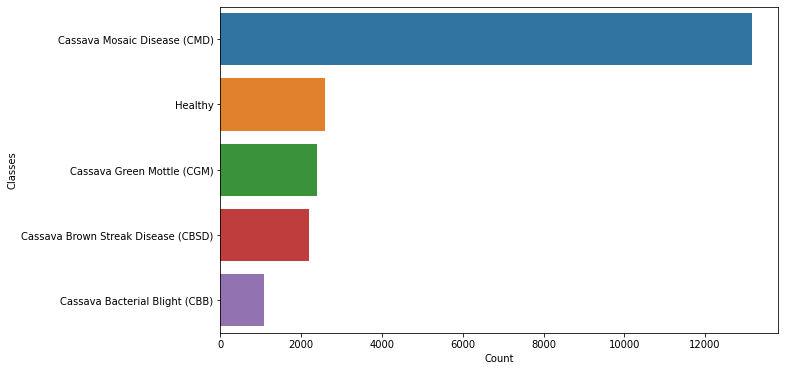

In [15]:
plt.figure(figsize=(10, 6))

sns.barplot(x='class', y='index', data=df_train['class'].value_counts().to_frame().reset_index())
plt.xlabel('Count')
plt.ylabel('Classes')
plt.show()

In [16]:
np.round((df_train['class'].value_counts() / len(df_train['class'])) * 100, 2)

Cassava Mosaic Disease (CMD)           61.49
Healthy                                12.04
Cassava Green Mottle (CGM)             11.15
Cassava Brown Streak Disease (CBSD)    10.23
Cassava Bacterial Blight (CBB)          5.08
Name: class, dtype: float64

We see that there is a heavy class imbalance in the dataset with class 3 (Cassava Mosaic Disease (CMD)) have]ing 61% of the dataset while class 0  (Cassava Bacterial Blight (CBB)) has only 5% of the dataset.

We should explore ways to balance this dataset

## Exploratory Data Analysis

In [17]:
path = "../cassava-leaf-disease-classification"

In [18]:
def plot(images, labels, predictions = None):
    n_cols = min(3, len(images))
    n_rows = math.ceil(len(images) / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize = (21,16))

    if predictions is None:
              
        predictions = [None] * len(labels)


    for i, (x, y_true, y_pred) in enumerate(zip(images, labels, predictions)):
        
        ax = axes.flat[i]
        a = plt.imread(os.path.join(path,"train_images", x ))
        ax.imshow(a)

        
        ax.set_title(f"Class: {y_true}")
             
        if y_pred is not None:
            ax.set_xlabel(f"Pred: {y_pred}", color='blue', fontweight='bold')

        ax.set_xticks([])
        ax.set_yticks([])

### Samples of "0": "Cassava Bacterial Blight (CBB)"

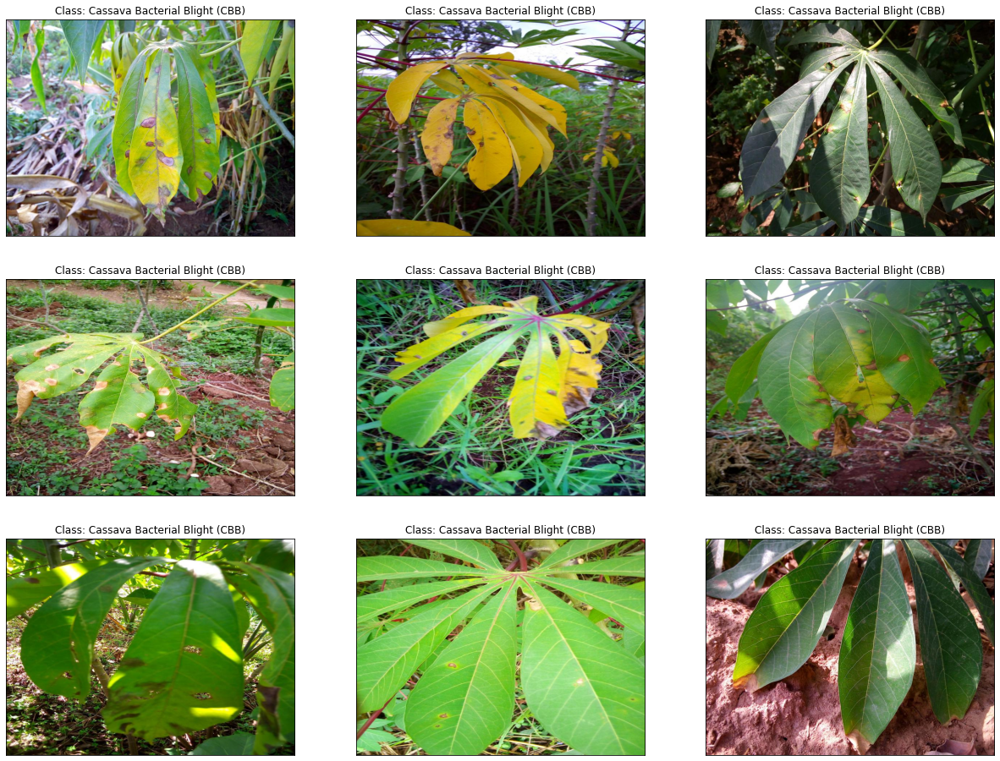

In [19]:
df_0 = df_train[df_train['label']==0]
df_0 = df_0.sample(9)
df_0_id = df_0['image_id'].values
df_0_class = df_0['class'].values

plot(df_0_id, df_0_class)

### Samples of "1": "Cassava Brown Streak Disease (CBSD)"

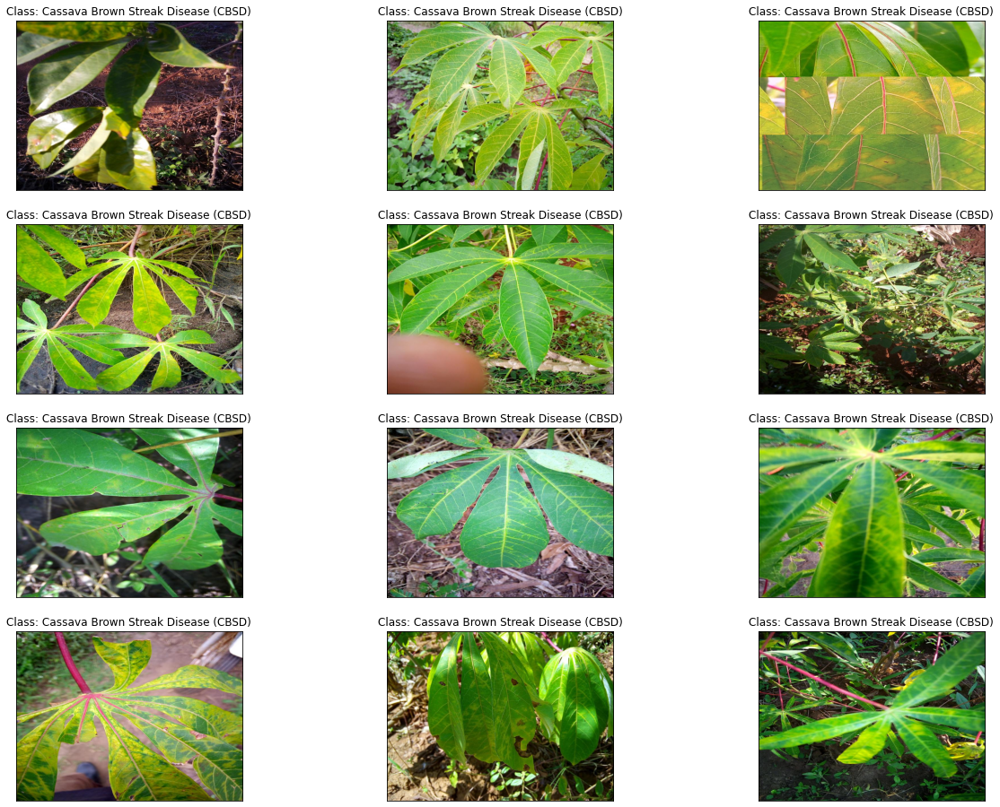

In [20]:
df_1 = df_train[df_train['label']==1]
df_1 = df_1.sample(12)
df_1_id = df_1['image_id'].values
df_1_class = df_1['class'].values

plot(df_1_id, df_1_class)

### Samples of "2": "Cassava Green Mottle (CGM)"

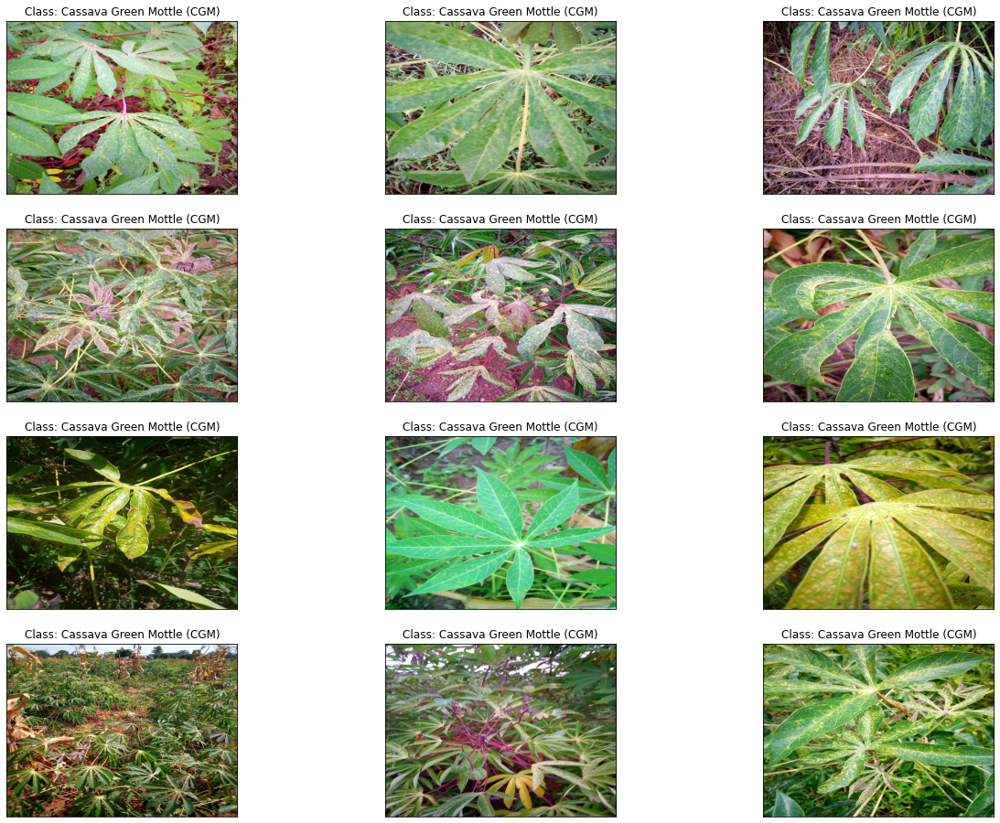

In [21]:
df_2 = df_train[df_train['label']==2]
df_2 = df_2.sample(12)
df_2_id = df_2['image_id'].values
df_2_class = df_2['class'].values

plot(df_2_id, df_2_class)

### Samples of   "3": "Cassava Mosaic Disease (CMD)"

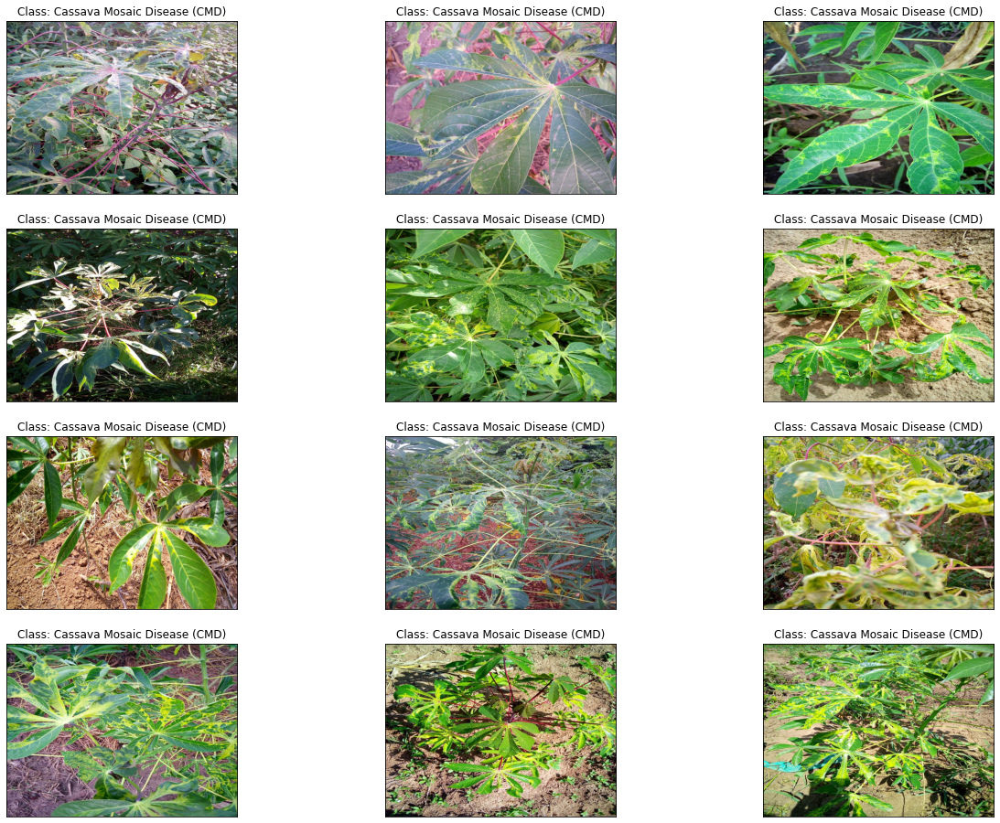

In [22]:
df_3 = df_train[df_train['label']==3]
df_3 = df_3.sample(12)
df_3_id = df_3['image_id'].values
df_3_class = df_3['class'].values

plot(df_3_id, df_3_class)

### Samples of "4": "Healthy"

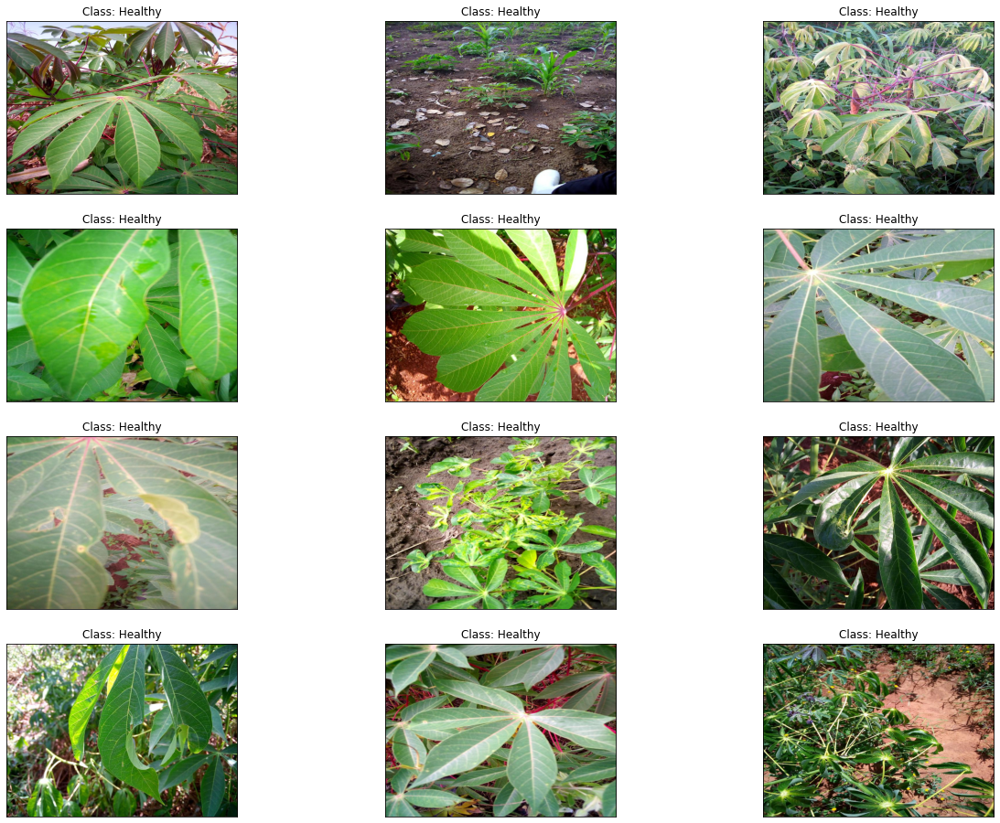

In [23]:
df_4 = df_train[df_train['label']==4]
df_4 = df_4.sample(12)
df_4_id = df_4['image_id'].values
df_4_class = df_4['class'].values

plot(df_4_id, df_4_class)

## Baseline Accuracy with Data Imbalance

In [24]:
y_pred = [3] * len(df_train.label)
print("The baseline accuracy is {}".format(accuracy_score(y_pred, df_train.label)))

The baseline accuracy is 0.6149460204701593


The default accuracy is 61% since label "3" represents 61% of the entire data, if we predict that all the leaves are in label "3", we get an accuracy of 61%.

## Handling Class Imbalance Using KFold Validation and ImageDataGenerator

In [25]:
def create_folds(df_train, n_split):
    df_train.loc[:, "kfold"] = -1
    df_train = df_train.sample(frac=1).reset_index(drop=True)
    SS = StratifiedKFold(n_splits=n_split)
    y = df_train.label.values
    for fold, (t_,v_) in enumerate((SS.split(X=df_train,y=y))):
        df_train.loc[v_, "kfold"] = fold
    return df_train

In [26]:
df_train['label'] = df_train['label'].astype('str')

In [27]:
df_train = create_folds(df_train, 5)
df_train.head(5)

,image_id,label,class,kfold
0,748154559.jpg,3,Cassava Mosaic Disease (CMD),0
1,503916638.jpg,3,Cassava Mosaic Disease (CMD),0
2,4063529695.jpg,3,Cassava Mosaic Disease (CMD),0
3,1166951694.jpg,3,Cassava Mosaic Disease (CMD),0
4,694387219.jpg,1,Cassava Brown Streak Disease (CBSD),0


In [28]:
df_train['kfold'].value_counts()

0    4280
1    4280
2    4279
3    4279
4    4279
Name: kfold, dtype: int64

## Apply Data Transforms and Specify Data Loaders

In [29]:
train_dir = '../cassava-leaf-disease-classification/train_images'

def data_generator(train, validation , batch_size, img_rows, img_cols):
        
        train_datagen = ImageDataGenerator(rescale=1./225,
                           rotation_range=40,
                           width_shift_range=0.2,
                           height_shift_range=0.2,
                           shear_range=0.2,
                           zoom_range=0.2,
                           horizontal_flip=True,)
        
        validation_datagen = ImageDataGenerator(rescale=1./255,)
        
        train_gen = train_datagen.flow_from_dataframe(train,
                                                    train_dir,
                                                    x_col = 'image_id',
                                                    y_col = 'label',
                                                    target_size=(img_rows, img_cols),
                                                    seed = 42,
                                                    batch_size=batch_size,
                                                    class_mode='categorical',
                                                    interpolation = 'nearest',
                                                    shuffle=True)

        validation_gen = validation_datagen.flow_from_dataframe(validation,
                                                    train_dir,
                                                    x_col = 'image_id',
                                                    y_col = 'label',
                                                    target_size=(img_rows, img_cols),
                                                    seed = 42,
                                                    batch_size=batch_size,
                                                    class_mode='categorical',
                                                    interpolation = 'nearest',
                                                    shuffle=False)
        
        return train_gen, validation_gen

## Base Model - CNN Model

### Model Architecture

In [30]:
def create_model():
    
    # Instantiate model
    model = models.Sequential()
    
    # Add Convolution layer first
    model.add(layers.Conv2D(filters=32, kernel_size=(3,3), input_shape=(224, 224, 3), activation="relu"))
    model.add(layers.MaxPool2D(pool_size=(2,2)))
    
    # Add Convolution layer first
    model.add(layers.Conv2D(filters=64, kernel_size=(3,3), activation="relu"))
    model.add(layers.MaxPool2D(pool_size=(2,2)))
    
    # Add Convolution layer first
    model.add(layers.Conv2D(filters=128, kernel_size=(3,3), activation="relu"))
    model.add(layers.MaxPool2D(pool_size=(2,2)))
    
    # Add Convolution layer first
    model.add(layers.Conv2D(filters=128, kernel_size=(3,3), activation="relu"))
    model.add(layers.MaxPool2D(pool_size=(2,2)))
    
    # Flatten out the model
    model.add(layers.Flatten())
    
    # Add Dense layer now
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dropout(0.5))
    
    # Add output layer
    model.add(layers.Dense(5, activation='softmax'))
    
    # Compile the model
    model.compile(optimizer='adam', loss = "categorical_crossentropy", metrics = ["accuracy"]) 
    
    return model

In [31]:
base_model = create_model()

In [32]:
base_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 26, 26, 128)      0

In [35]:
checkpoint_filepath = '../checkpoint'

def train_model(df, batch_size, img_rows, img_cols, fold, model):
    
    t1_1 = datetime.now()
    
    train = df[df.kfold != fold].reset_index(drop=True)
    validation = df[df.kfold == fold].reset_index(drop=True)
    
    train_generator, validation_generator = data_generator(train, validation, batch_size, img_rows, img_cols)
    
    callback_list = [callbacks.EarlyStopping(monitor='val_accuracy', patience=3, mode='max', restore_best_weights=True),
                    callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, mode='min'),
                    callbacks. ModelCheckpoint(f'base_model{fold}.hdf5', monitor = 'val_loss', verbose = 1, 
                           mode = 'min', save_best_only = True),
                    callbacks.ModelCheckpoint(filepath=checkpoint_filepath, monitor='val_accuracy', verbose=1, 
                                  save_best_only=True, save_weights_only=False, mode="max", save_freq="epoch")]
      
    history = model.fit(train_generator, validation_data=validation_generator, callbacks=callback_list, epochs=10)
    
    return model, history, train_generator, validation_generator

-------------------------
0-fold training
-------------------------
Found 17117 validated image filenames belonging to 5 classes.
Found 4280 validated image filenames belonging to 5 classes.
Epoch 1/10
535/535 [==============================] - ETA: 0s - loss: 1.1077 - accuracy: 0.6206
Epoch 1: val_loss improved from inf to 1.04962, saving model to base_model0.hdf5

Epoch 1: val_accuracy improved from -inf to 0.62640, saving model to ..\checkpoint


INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 430s 785ms/step - loss: 1.1077 - accuracy: 0.6206 - val_loss: 1.0496 - val_accuracy: 0.6264 - lr: 0.0010
Epoch 2/10
535/535 [==============================] - ETA: 0s - loss: 1.0086 - accuracy: 0.6335
Epoch 2: val_loss improved from 1.04962 to 0.93339, saving model to base_model0.hdf5

Epoch 2: val_accuracy improved from 0.62640 to 0.65678, saving model to ..\checkpoint


INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 385s 719ms/step - loss: 1.0086 - accuracy: 0.6335 - val_loss: 0.9334 - val_accuracy: 0.6568 - lr: 0.0010
Epoch 3/10
535/535 [==============================] - ETA: 0s - loss: 0.9480 - accuracy: 0.6532
Epoch 3: val_loss improved from 0.93339 to 0.89281, saving model to base_model0.hdf5

Epoch 3: val_accuracy improved from 0.65678 to 0.67079, saving model to ..\checkpoint


INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 373s 697ms/step - loss: 0.9480 - accuracy: 0.6532 - val_loss: 0.8928 - val_accuracy: 0.6708 - lr: 0.0010
Epoch 4/10
535/535 [==============================] - ETA: 0s - loss: 0.8945 - accuracy: 0.6683
Epoch 4: val_loss improved from 0.89281 to 0.86998, saving model to base_model0.hdf5

Epoch 4: val_accuracy improved from 0.67079 to 0.67523, saving model to ..\checkpoint


INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 331s 619ms/step - loss: 0.8945 - accuracy: 0.6683 - val_loss: 0.8700 - val_accuracy: 0.6752 - lr: 0.0010
Epoch 5/10
535/535 [==============================] - ETA: 0s - loss: 0.8759 - accuracy: 0.6716
Epoch 5: val_loss improved from 0.86998 to 0.83412, saving model to base_model0.hdf5

Epoch 5: val_accuracy improved from 0.67523 to 0.68949, saving model to ..\checkpoint


INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 381s 712ms/step - loss: 0.8759 - accuracy: 0.6716 - val_loss: 0.8341 - val_accuracy: 0.6895 - lr: 0.0010
Epoch 6/10
535/535 [==============================] - ETA: 0s - loss: 0.8412 - accuracy: 0.6815
Epoch 6: val_loss improved from 0.83412 to 0.76377, saving model to base_model0.hdf5

Epoch 6: val_accuracy improved from 0.68949 to 0.70234, saving model to ..\checkpoint


INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 360s 672ms/step - loss: 0.8412 - accuracy: 0.6815 - val_loss: 0.7638 - val_accuracy: 0.7023 - lr: 0.0010
Epoch 7/10
535/535 [==============================] - ETA: 0s - loss: 0.8241 - accuracy: 0.6907
Epoch 7: val_loss did not improve from 0.76377

Epoch 7: val_accuracy improved from 0.70234 to 0.71565, saving model to ..\checkpoint


INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 326s 610ms/step - loss: 0.8241 - accuracy: 0.6907 - val_loss: 0.7938 - val_accuracy: 0.7157 - lr: 0.0010
Epoch 8/10
535/535 [==============================] - ETA: 0s - loss: 0.8051 - accuracy: 0.6969
Epoch 8: val_loss improved from 0.76377 to 0.76177, saving model to base_model0.hdf5

Epoch 8: val_accuracy improved from 0.71565 to 0.72430, saving model to ..\checkpoint


INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 337s 629ms/step - loss: 0.8051 - accuracy: 0.6969 - val_loss: 0.7618 - val_accuracy: 0.7243 - lr: 0.0010
Epoch 9/10
535/535 [==============================] - ETA: 0s - loss: 0.7756 - accuracy: 0.7096
Epoch 9: val_loss improved from 0.76177 to 0.67892, saving model to base_model0.hdf5

Epoch 9: val_accuracy improved from 0.72430 to 0.74509, saving model to ..\checkpoint


INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 359s 671ms/step - loss: 0.7756 - accuracy: 0.7096 - val_loss: 0.6789 - val_accuracy: 0.7451 - lr: 0.0010
Epoch 10/10
535/535 [==============================] - ETA: 0s - loss: 0.7626 - accuracy: 0.7124
Epoch 10: val_loss did not improve from 0.67892

Epoch 10: val_accuracy did not improve from 0.74509
535/535 [==============================] - 284s 529ms/step - loss: 0.7626 - accuracy: 0.7124 - val_loss: 0.7653 - val_accuracy: 0.7157 - lr: 0.0010


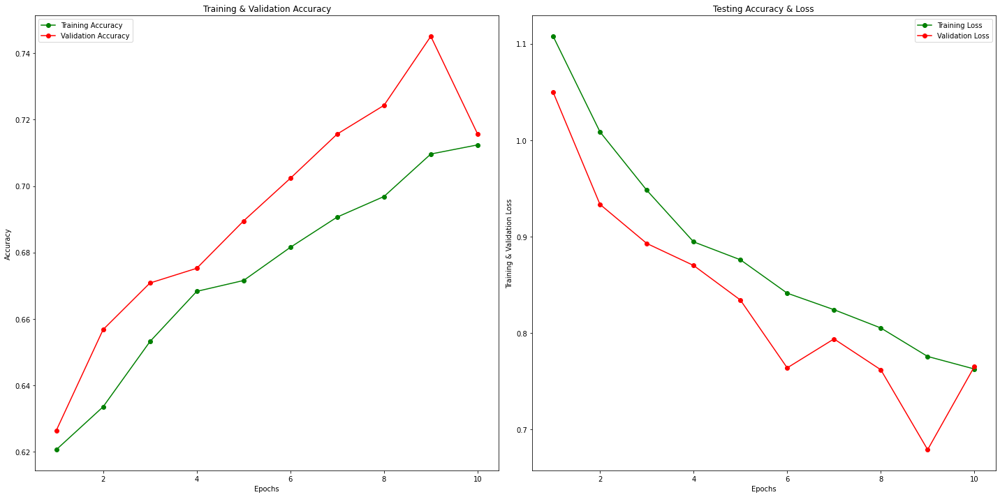

Model computation time: 0:59:29.828746
-------------------------
1-fold training
-------------------------
Found 17117 validated image filenames belonging to 5 classes.
Found 4280 validated image filenames belonging to 5 classes.
Epoch 1/10
535/535 [==============================] - ETA: 0s - loss: 0.7434 - accuracy: 0.7233
Epoch 1: val_loss improved from inf to 0.69165, saving model to base_model1.hdf5

Epoch 1: val_accuracy improved from -inf to 0.75421, saving model to ..\checkpoint


INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 224s 418ms/step - loss: 0.7434 - accuracy: 0.7233 - val_loss: 0.6916 - val_accuracy: 0.7542 - lr: 0.0010
Epoch 2/10
535/535 [==============================] - ETA: 0s - loss: 0.7277 - accuracy: 0.7276
Epoch 2: val_loss improved from 0.69165 to 0.67142, saving model to base_model1.hdf5

Epoch 2: val_accuracy improved from 0.75421 to 0.75607, saving model to ..\checkpoint


INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 223s 417ms/step - loss: 0.7277 - accuracy: 0.7276 - val_loss: 0.6714 - val_accuracy: 0.7561 - lr: 0.0010
Epoch 3/10
535/535 [==============================] - ETA: 0s - loss: 0.7220 - accuracy: 0.7309
Epoch 3: val_loss did not improve from 0.67142

Epoch 3: val_accuracy did not improve from 0.75607
535/535 [==============================] - 228s 426ms/step - loss: 0.7220 - accuracy: 0.7309 - val_loss: 0.7654 - val_accuracy: 0.7145 - lr: 0.0010
Epoch 4/10
535/535 [==============================] - ETA: 0s - loss: 0.7199 - accuracy: 0.7340
Epoch 4: val_loss improved from 0.67142 to 0.66026, saving model to base_model1.hdf5

Epoch 4: val_accuracy did not improve from 0.75607
535/535 [==============================] - 210s 392ms/step - loss: 0.7199 - accuracy: 0.7340 - val_loss: 0.6603 - val_accuracy: 0.7558 - lr: 0.0010
Epoch 5/10
535/535 [==============================] - ETA: 0s - loss: 0.7074 - accuracy: 0.7386
Epoch 5: val_loss improved from 

INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 285s 533ms/step - loss: 0.7074 - accuracy: 0.7386 - val_loss: 0.6302 - val_accuracy: 0.7650 - lr: 0.0010
Epoch 6/10
535/535 [==============================] - ETA: 0s - loss: 0.6943 - accuracy: 0.7451
Epoch 6: val_loss did not improve from 0.63024

Epoch 6: val_accuracy did not improve from 0.76495
535/535 [==============================] - 210s 392ms/step - loss: 0.6943 - accuracy: 0.7451 - val_loss: 0.6704 - val_accuracy: 0.7575 - lr: 0.0010
Epoch 7/10
535/535 [==============================] - ETA: 0s - loss: 0.6900 - accuracy: 0.7464
Epoch 7: val_loss did not improve from 0.63024

Epoch 7: val_accuracy did not improve from 0.76495
535/535 [==============================] - 275s 514ms/step - loss: 0.6900 - accuracy: 0.7464 - val_loss: 0.6648 - val_accuracy: 0.7472 - lr: 0.0010
Epoch 8/10
535/535 [==============================] - ETA: 0s - loss: 0.6956 - accuracy: 0.7432
Epoch 8: val_loss did not improve from 0.63024

Epoch 8: val_accuracy 

INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 343s 641ms/step - loss: 0.6956 - accuracy: 0.7432 - val_loss: 0.6369 - val_accuracy: 0.7659 - lr: 0.0010
Epoch 9/10
535/535 [==============================] - ETA: 0s - loss: 0.6745 - accuracy: 0.7506
Epoch 9: val_loss did not improve from 0.63024

Epoch 9: val_accuracy improved from 0.76589 to 0.76776, saving model to ..\checkpoint


INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 348s 650ms/step - loss: 0.6745 - accuracy: 0.7506 - val_loss: 0.6473 - val_accuracy: 0.7678 - lr: 0.0010
Epoch 10/10
535/535 [==============================] - ETA: 0s - loss: 0.6670 - accuracy: 0.7605
Epoch 10: val_loss improved from 0.63024 to 0.60688, saving model to base_model1.hdf5

Epoch 10: val_accuracy improved from 0.76776 to 0.78388, saving model to ..\checkpoint


INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 227s 423ms/step - loss: 0.6670 - accuracy: 0.7605 - val_loss: 0.6069 - val_accuracy: 0.7839 - lr: 0.0010


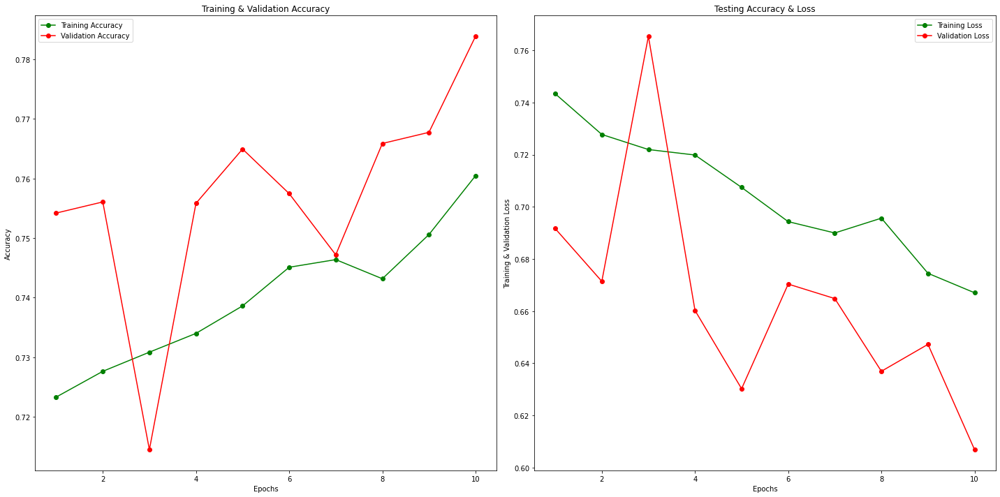

Model computation time: 0:43:11.230189
-------------------------
2-fold training
-------------------------
Found 17118 validated image filenames belonging to 5 classes.
Found 4279 validated image filenames belonging to 5 classes.
Epoch 1/10
535/535 [==============================] - ETA: 0s - loss: 0.6678 - accuracy: 0.7544
Epoch 1: val_loss improved from inf to 0.62199, saving model to base_model2.hdf5

Epoch 1: val_accuracy improved from -inf to 0.75391, saving model to ..\checkpoint


INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 220s 411ms/step - loss: 0.6678 - accuracy: 0.7544 - val_loss: 0.6220 - val_accuracy: 0.7539 - lr: 0.0010
Epoch 2/10
535/535 [==============================] - ETA: 0s - loss: 0.6603 - accuracy: 0.7572
Epoch 2: val_loss did not improve from 0.62199

Epoch 2: val_accuracy improved from 0.75391 to 0.77168, saving model to ..\checkpoint


INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 217s 405ms/step - loss: 0.6603 - accuracy: 0.7572 - val_loss: 0.6294 - val_accuracy: 0.7717 - lr: 0.0010
Epoch 3/10
535/535 [==============================] - ETA: 0s - loss: 0.6552 - accuracy: 0.7605
Epoch 3: val_loss did not improve from 0.62199

Epoch 3: val_accuracy did not improve from 0.77168
535/535 [==============================] - 211s 393ms/step - loss: 0.6552 - accuracy: 0.7605 - val_loss: 0.6617 - val_accuracy: 0.7607 - lr: 0.0010
Epoch 4/10
535/535 [==============================] - ETA: 0s - loss: 0.6517 - accuracy: 0.7628
Epoch 4: val_loss did not improve from 0.62199

Epoch 4: val_accuracy improved from 0.77168 to 0.77331, saving model to ..\checkpoint


INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 209s 391ms/step - loss: 0.6517 - accuracy: 0.7628 - val_loss: 0.6421 - val_accuracy: 0.7733 - lr: 0.0010
Epoch 5/10
535/535 [==============================] - ETA: 0s - loss: 0.6489 - accuracy: 0.7621
Epoch 5: val_loss did not improve from 0.62199

Epoch 5: val_accuracy did not improve from 0.77331
535/535 [==============================] - 210s 393ms/step - loss: 0.6489 - accuracy: 0.7621 - val_loss: 0.6647 - val_accuracy: 0.7609 - lr: 0.0010
Epoch 6/10
535/535 [==============================] - ETA: 0s - loss: 0.6456 - accuracy: 0.7650
Epoch 6: val_loss did not improve from 0.62199

Epoch 6: val_accuracy did not improve from 0.77331
535/535 [==============================] - 206s 384ms/step - loss: 0.6456 - accuracy: 0.7650 - val_loss: 0.6560 - val_accuracy: 0.7450 - lr: 0.0010
Epoch 7/10
535/535 [==============================] - ETA: 0s - loss: 0.5957 - accuracy: 0.7865
Epoch 7: val_loss improved from 0.62199 to 0.56960, saving model to ba

INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 210s 393ms/step - loss: 0.5957 - accuracy: 0.7865 - val_loss: 0.5696 - val_accuracy: 0.7887 - lr: 1.0000e-04
Epoch 8/10
535/535 [==============================] - ETA: 0s - loss: 0.5854 - accuracy: 0.7916
Epoch 8: val_loss improved from 0.56960 to 0.56551, saving model to base_model2.hdf5

Epoch 8: val_accuracy did not improve from 0.78874
535/535 [==============================] - 245s 458ms/step - loss: 0.5854 - accuracy: 0.7916 - val_loss: 0.5655 - val_accuracy: 0.7866 - lr: 1.0000e-04
Epoch 9/10
535/535 [==============================] - ETA: 0s - loss: 0.5771 - accuracy: 0.7925
Epoch 9: val_loss improved from 0.56551 to 0.56101, saving model to base_model2.hdf5

Epoch 9: val_accuracy improved from 0.78874 to 0.79247, saving model to ..\checkpoint


INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 246s 459ms/step - loss: 0.5771 - accuracy: 0.7925 - val_loss: 0.5610 - val_accuracy: 0.7925 - lr: 1.0000e-04
Epoch 10/10
535/535 [==============================] - ETA: 0s - loss: 0.5724 - accuracy: 0.7938
Epoch 10: val_loss did not improve from 0.56101

Epoch 10: val_accuracy improved from 0.79247 to 0.79294, saving model to ..\checkpoint


INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 211s 393ms/step - loss: 0.5724 - accuracy: 0.7938 - val_loss: 0.5682 - val_accuracy: 0.7929 - lr: 1.0000e-04


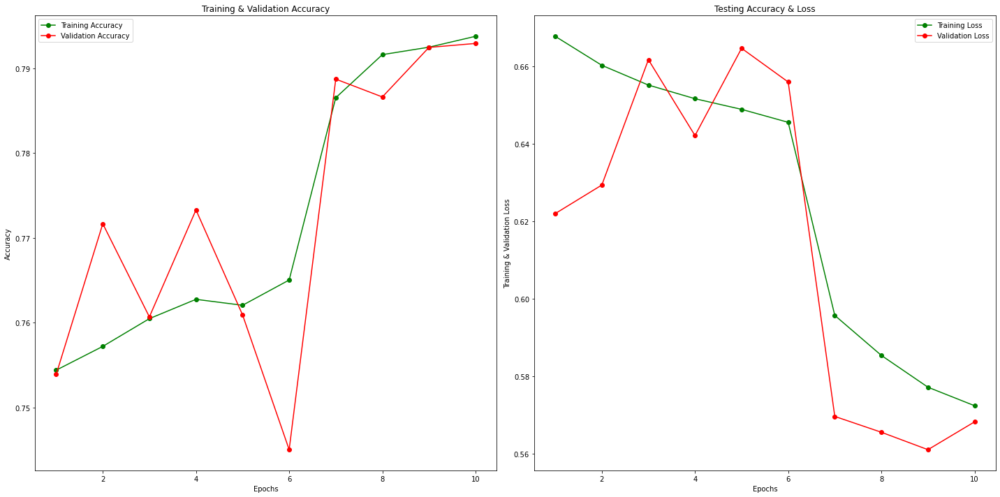

Model computation time: 0:36:28.050440
-------------------------
3-fold training
-------------------------
Found 17118 validated image filenames belonging to 5 classes.
Found 4279 validated image filenames belonging to 5 classes.
Epoch 1/10
535/535 [==============================] - ETA: 0s - loss: 0.5788 - accuracy: 0.7898
Epoch 1: val_loss improved from inf to 0.55906, saving model to base_model3.hdf5

Epoch 1: val_accuracy improved from -inf to 0.80533, saving model to ..\checkpoint


INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 211s 394ms/step - loss: 0.5788 - accuracy: 0.7898 - val_loss: 0.5591 - val_accuracy: 0.8053 - lr: 1.0000e-04
Epoch 2/10
535/535 [==============================] - ETA: 0s - loss: 0.5711 - accuracy: 0.7957
Epoch 2: val_loss improved from 0.55906 to 0.54510, saving model to base_model3.hdf5

Epoch 2: val_accuracy improved from 0.80533 to 0.80860, saving model to ..\checkpoint


INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 216s 404ms/step - loss: 0.5711 - accuracy: 0.7957 - val_loss: 0.5451 - val_accuracy: 0.8086 - lr: 1.0000e-04
Epoch 3/10
535/535 [==============================] - ETA: 0s - loss: 0.5710 - accuracy: 0.7948
Epoch 3: val_loss did not improve from 0.54510

Epoch 3: val_accuracy did not improve from 0.80860
535/535 [==============================] - 209s 391ms/step - loss: 0.5710 - accuracy: 0.7948 - val_loss: 0.5566 - val_accuracy: 0.8067 - lr: 1.0000e-04
Epoch 4/10
535/535 [==============================] - ETA: 0s - loss: 0.5700 - accuracy: 0.7963
Epoch 4: val_loss did not improve from 0.54510

Epoch 4: val_accuracy did not improve from 0.80860
535/535 [==============================] - 211s 394ms/step - loss: 0.5700 - accuracy: 0.7963 - val_loss: 0.5493 - val_accuracy: 0.8051 - lr: 1.0000e-04
Epoch 5/10
535/535 [==============================] - ETA: 0s - loss: 0.5674 - accuracy: 0.7997
Epoch 5: val_loss did not improve from 0.54510

Epoch 5: v

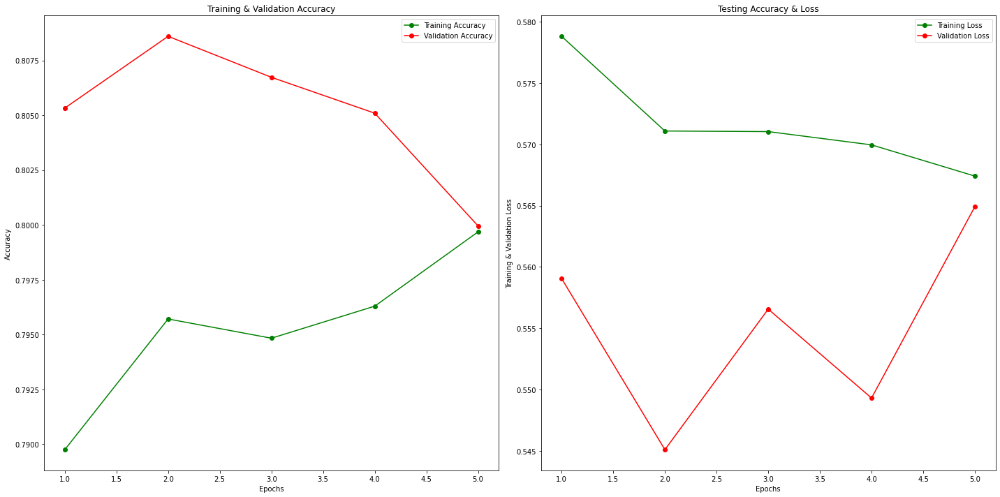

Model computation time: 0:17:40.567137
-------------------------
4-fold training
-------------------------
Found 17118 validated image filenames belonging to 5 classes.
Found 4279 validated image filenames belonging to 5 classes.
Epoch 1/10
535/535 [==============================] - ETA: 0s - loss: 0.5727 - accuracy: 0.7964
Epoch 1: val_loss improved from inf to 0.56297, saving model to base_model4.hdf5

Epoch 1: val_accuracy improved from -inf to 0.80393, saving model to ..\checkpoint


INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 209s 390ms/step - loss: 0.5727 - accuracy: 0.7964 - val_loss: 0.5630 - val_accuracy: 0.8039 - lr: 1.0000e-04
Epoch 2/10
535/535 [==============================] - ETA: 0s - loss: 0.5743 - accuracy: 0.7965
Epoch 2: val_loss improved from 0.56297 to 0.54895, saving model to base_model4.hdf5

Epoch 2: val_accuracy improved from 0.80393 to 0.80883, saving model to ..\checkpoint


INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 211s 394ms/step - loss: 0.5743 - accuracy: 0.7965 - val_loss: 0.5489 - val_accuracy: 0.8088 - lr: 1.0000e-04
Epoch 3/10
535/535 [==============================] - ETA: 0s - loss: 0.5627 - accuracy: 0.7994
Epoch 3: val_loss improved from 0.54895 to 0.54616, saving model to base_model4.hdf5

Epoch 3: val_accuracy did not improve from 0.80883
535/535 [==============================] - 210s 393ms/step - loss: 0.5627 - accuracy: 0.7994 - val_loss: 0.5462 - val_accuracy: 0.8079 - lr: 1.0000e-04
Epoch 4/10
535/535 [==============================] - ETA: 0s - loss: 0.5674 - accuracy: 0.7991
Epoch 4: val_loss improved from 0.54616 to 0.54104, saving model to base_model4.hdf5

Epoch 4: val_accuracy did not improve from 0.80883
535/535 [==============================] - 209s 391ms/step - loss: 0.5674 - accuracy: 0.7991 - val_loss: 0.5410 - val_accuracy: 0.8070 - lr: 1.0000e-04
Epoch 5/10
535/535 [==============================] - ETA: 0s - loss: 0.5606 -

INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


535/535 [==============================] - 209s 391ms/step - loss: 0.5606 - accuracy: 0.8031 - val_loss: 0.5343 - val_accuracy: 0.8109 - lr: 1.0000e-04
Epoch 6/10
535/535 [==============================] - ETA: 0s - loss: 0.5602 - accuracy: 0.8009
Epoch 6: val_loss did not improve from 0.53425

Epoch 6: val_accuracy did not improve from 0.81094
535/535 [==============================] - 209s 390ms/step - loss: 0.5602 - accuracy: 0.8009 - val_loss: 0.5389 - val_accuracy: 0.8077 - lr: 1.0000e-04
Epoch 7/10
535/535 [==============================] - ETA: 0s - loss: 0.5605 - accuracy: 0.8007
Epoch 7: val_loss improved from 0.53425 to 0.53037, saving model to base_model4.hdf5

Epoch 7: val_accuracy did not improve from 0.81094
535/535 [==============================] - 208s 389ms/step - loss: 0.5605 - accuracy: 0.8007 - val_loss: 0.5304 - val_accuracy: 0.8107 - lr: 1.0000e-04
Epoch 8/10
535/535 [==============================] - ETA: 0s - loss: 0.5591 - accuracy: 0.7990
Epoch 8: val_loss di

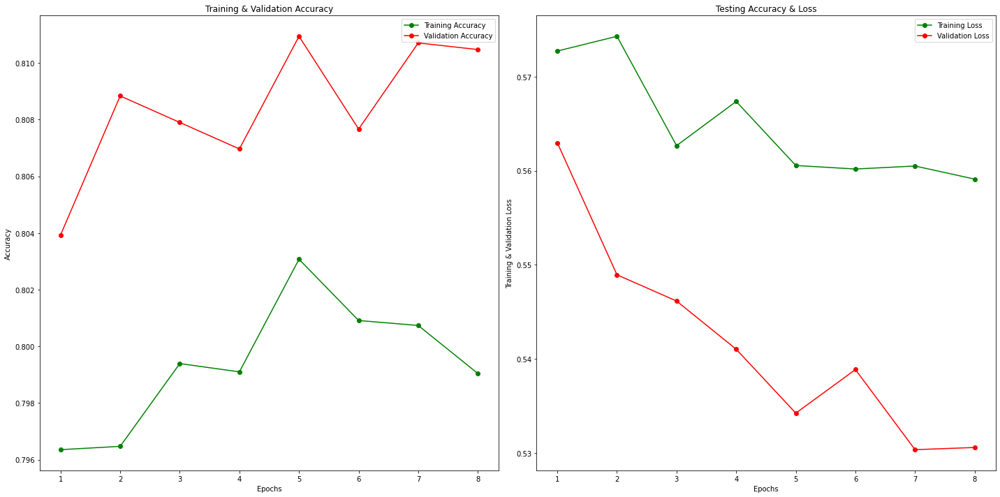

Model computation time: 0:28:13.739001


In [36]:
base_oof_acc=[]
base_oof_val_acc=[]
base_oof_loss=[]
base_oof_val_loss=[]
base_model_time = []

for i in range(5):
    
    t1_1 = datetime.now()
    
    print(25*"-")    
    print(f'{i}-fold training')
    print(25*"-")

    base_model, history, train_generator, validation_generator = train_model(df_train, 32, 224, 224, i, base_model)

    train_accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']

    base_oof_acc.append(train_accuracy)
    base_oof_val_acc.append(val_accuracy)
    base_oof_loss.append(train_loss)
    base_oof_val_loss.append(val_loss)

    epochs = range(1, len(train_accuracy) + 1)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    fig.set_size_inches(20,10)

    ax1.plot(epochs , train_accuracy , 'go-' , label = 'Training Accuracy')
    ax1.plot(epochs , val_accuracy , 'ro-' , label = 'Validation Accuracy')
    ax1.set_title('Training & Validation Accuracy')
    ax1.legend()
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Accuracy")

    ax2.plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
    ax2.plot(epochs , val_loss , 'r-o' , label = 'Validation Loss')
    ax2.set_title('Testing Accuracy & Loss')
    ax2.legend()
    ax2.set_xlabel("Epochs")
    ax2.set_ylabel("Training & Validation Loss")

    fig.tight_layout()
    plt.show()
    
    t2_1 = datetime.now()
    base_model_time.append(str(t2_1 - t1_1))
    print("Model computation time: " + str(t2_1 - t1_1))

In [38]:
base_acc_average = [sum(sub_list) / len(sub_list) for sub_list in base_oof_acc]
base_val_acc_average = [sum(sub_list) / len(sub_list) for sub_list in base_oof_val_acc]
base_loss_average = [sum(sub_list) / len(sub_list) for sub_list in base_oof_loss]
base_val_loss_average = [sum(sub_list) / len(sub_list) for sub_list in base_oof_val_loss]

In [39]:
print("Average training accuracy across 5 folds with ten epochs each -", base_acc_average)
print("Average validation accuracy across 5 folds with ten epochs each -", base_val_acc_average)
print("Average training loss across 5 folds with ten epochs each -", base_loss_average)
print("Average validation loss across 5 folds with ten epochs each -", base_val_loss_average)

Average training accuracy across 5 folds with ten epochs each - [0.6738213360309601, 0.7400187015533447, 0.7726428389549256, 0.7952564597129822, 0.7993851453065872]
Average validation accuracy across 5 folds with ten epochs each - [0.6921728909015655, 0.75677570104599, 0.7726337969303131, 0.8051414012908935, 0.8084248676896095]
Average training loss across 5 folds with ten epochs each - [0.8843234539031982, 0.7041825175285339, 0.6259989857673645, 0.5716598153114318, 0.5646699741482735]
Average validation loss across 5 folds with ten epochs each - [0.8343440055847168, 0.6645218670368195, 0.6140233099460601, 0.5549903392791748, 0.5416530519723892]


In [40]:
base_model_time

['0:59:29.828746',
 '0:43:11.230189',
 '0:36:28.050440',
 '0:17:40.567137',
 '0:28:13.739001']

In [41]:
base_acc_average = [sum(sub_list) / len(sub_list) 
                    for sub_list in base_oof_acc]
base_acc_average

[0.6738213360309601,
 0.7400187015533447,
 0.7726428389549256,
 0.7952564597129822,
 0.7993851453065872]

In [42]:
print("KFold Validation Accuracy: ", np.hstack(base_oof_acc).mean())

KFold Validation Accuracy:  0.749678888986277


In [43]:
Y_pred = base_model.predict_generator(validation_generator)
y_pred = np.argmax(Y_pred, axis=1)
print('Classification Report')
target_names = list(train_generator.class_indices.keys()) # Classes
print(classification_report(validation_generator.classes, y_pred, target_names=target_names))

Classification Report
              precision    recall  f1-score   support

           0       0.51      0.37      0.43       217
           1       0.68      0.74      0.71       438
           2       0.66      0.60      0.63       477
           3       0.92      0.94      0.93      2631
           4       0.58      0.62      0.60       516

    accuracy                           0.81      4279
   macro avg       0.67      0.65      0.66      4279
weighted avg       0.81      0.81      0.81      4279



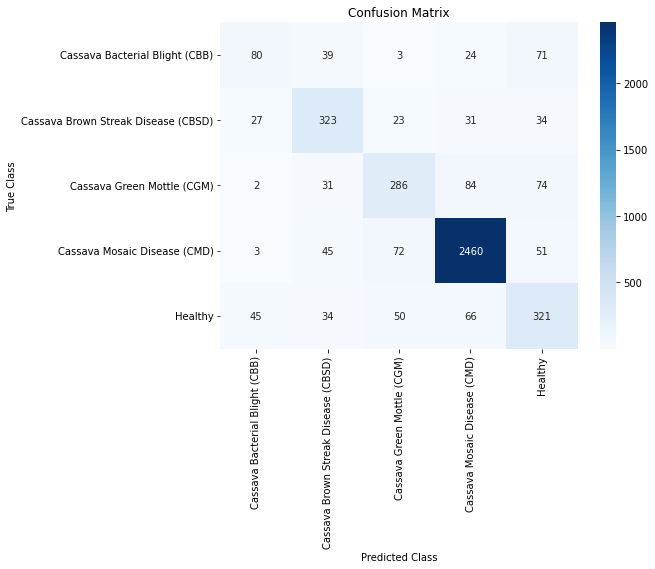

In [44]:
cm = confusion_matrix(validation_generator.classes, y_pred)
labels = ['Cassava Bacterial Blight (CBB)', 'Cassava Brown Streak Disease (CBSD)', 'Cassava Green Mottle (CGM)', 'Cassava Mosaic Disease (CMD)','Healthy']
plt.figure(figsize=(8,6))
sns.heatmap(cm,xticklabels=labels, yticklabels=labels, annot=True, fmt='d', cmap="Blues", vmin = 0.2);
plt.title('Confusion Matrix')
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.show()

In [45]:
pred = pd.DataFrame(y_pred, columns=['class_pred'])
pred['pred'] = pred['class_pred'].map({int(i) : c for i, c in disease_class.items()})

In [46]:
validation = df_train[df_train.kfold == 4].reset_index(drop=True)

image_ids_test = validation["image_id"].values
labels_test = validation["class"].values
pred_result = pred['pred'].values

In [47]:
rand_idxs = np.random.permutation(len(validation))[:9]

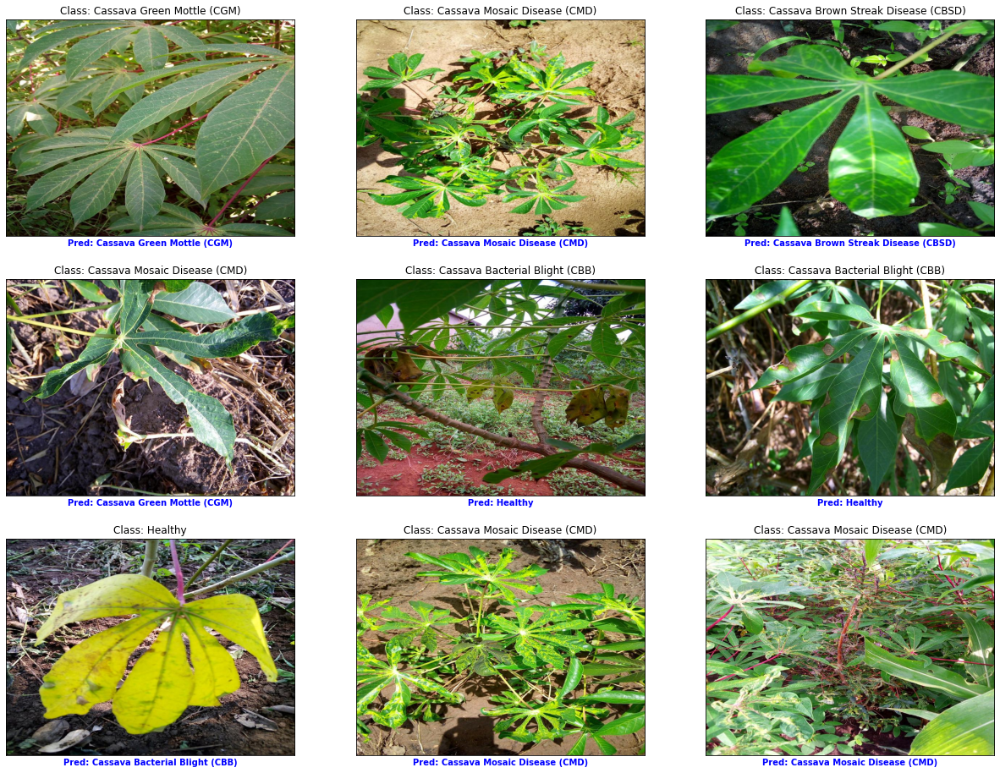

In [48]:
plot(image_ids_test[rand_idxs], labels_test[rand_idxs], pred_result[rand_idxs])
plt.show()

### Model Prediction

In [49]:
sample = pd.read_csv("../cassava-leaf-disease-classification/sample_submission.csv")
sample

,image_id,label
0,2216849948.jpg,4


In [52]:
model = tf.keras.models.load_model("base_model4.hdf5")

In [57]:
preds = []

for image in sample.image_id:
    img = tf.keras.preprocessing.image.load_img('../cassava-leaf-disease-classification/test_images/' + image)
    img = tf.keras.preprocessing.image.img_to_array(img)
    img = tf.keras.preprocessing.image.smart_resize(img, (224, 224))
    img = tf.reshape(img, (-1, 224, 224, 3))
    prediction = model.predict(img/255)
    preds.append(np.argmax(prediction))

submission = pd.DataFrame({'image_id': sample.image_id, 'label': preds})
submission.to_csv('submission.csv', index=False) 

1/1 [==============================] - 1s 573ms/step
